In [205]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import os

In [2]:
control_dir = '../control_images/'
penetramax_dir = '../penetramax_images/'

control_fnames = [control_dir + fname for fname in os.listdir(control_dir)]
penetramax_fnames = [penetramax_dir + fname for fname in os.listdir(penetramax_dir)]

control_fnames

['../control_images/010_z67.png',
 '../control_images/009_z70.png',
 '../control_images/005_z41.png',
 '../control_images/002_z54.png',
 '../control_images/003_z56.png',
 '../control_images/007_z62.png',
 '../control_images/006_z72.png',
 '../control_images/001_z26.png',
 '../control_images/008_z69.png',
 '../control_images/004_z62.png']

In [3]:
def show_image(fname, save_to=None):
    from matplotlib.pyplot import imread, subplots, delaxes, subplots_adjust, show, savefig
    from numpy import arange

    im = imread(fname)
    Nx, Ny, _ = im.shape
    
    red = im[:,:,0]
    blue = im[:,:,2]

    fig, axes = subplots(2, 2, gridspec_kw={'width_ratios': [4,1], 'height_ratios': [4,1]}, dpi=300)
    delaxes(axes[1,1])
    subplots_adjust(hspace=0, wspace=0)

    main, bottom, right = axes[0,0], axes[1,0], axes[0,1]

    main.imshow(im, origin='lower', aspect='auto')
    main.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
    main.set_ylabel(r'0$^\text{th}$ axis'); main.set_xlabel(r'1$^\text{st}$ axis')
    main.xaxis.set_label_position('top')

    bottom.fill_between(arange(Ny), red.sum(axis=0), color='r', alpha=0.5); bottom.fill_between(arange(Ny), blue.sum(axis=0), color='b', alpha=0.5)
    bottom.plot(arange(Ny), red.sum(axis=0), color='r'); bottom.plot(arange(Ny), blue.sum(axis=0), color='b')

    right.fill_betweenx(arange(Nx), red.sum(axis=1), color='r', alpha=0.5); right.fill_betweenx(arange(Nx), blue.sum(axis=1), color='b', alpha=0.5)
    right.plot(red.sum(axis=1), arange(Nx), color='r'); right.plot(blue.sum(axis=1), arange(Nx), color='b')

    bottom.set_yticks([]); bottom.set_xlim(0, Ny); bottom.set_ylim(0)
    right.set_xticks([]); right.set_ylim(0, Nx); right.set_xlim(0); right.invert_xaxis()
    right.tick_params(labelleft=False, right=True, labelright=True)

    if save_to is not None:
        savefig(save_to, dpi=300, bbox_inches='tight')

    show()

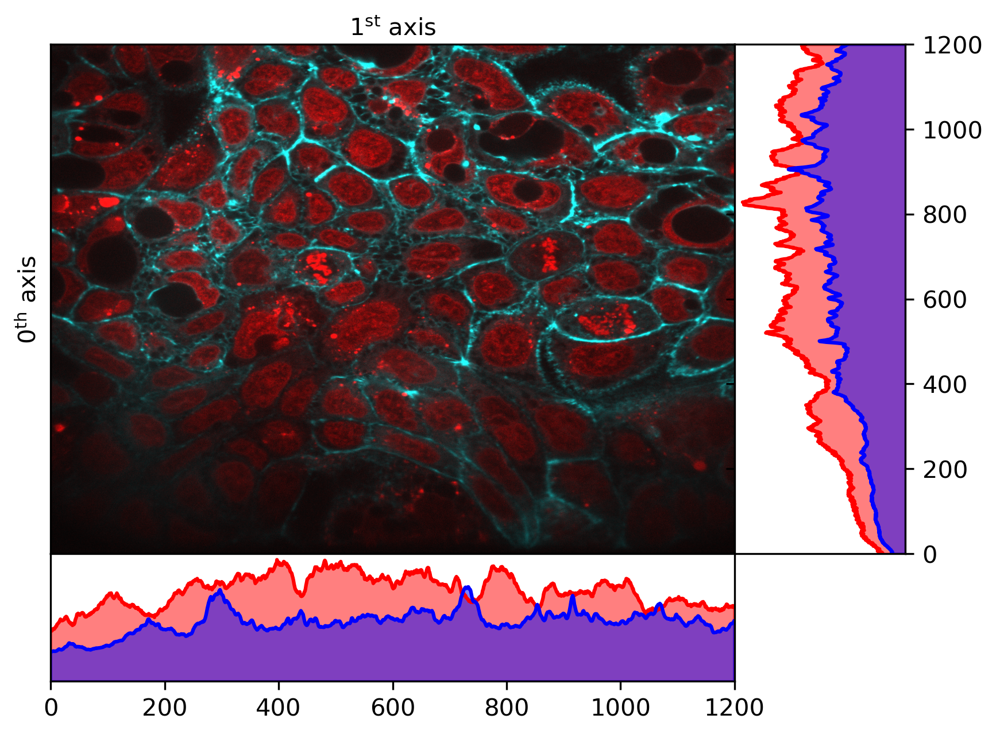

In [4]:
show_image(control_fnames[0], save_to='test.png')

In [5]:
def perform_hist_equalisation(image, nbins=256):
    from skimage.exposure import equalize_hist
    from numpy import stack

    red_corrected = equalize_hist(image[:,:,0], nbins=nbins)
    blue_corrected = equalize_hist(image[:,:,2], nbins=nbins)

    return stack([red_corrected, blue_corrected, blue_corrected], axis=2)

def perform_adapthist_equalisation(image, nbins=256):
    from skimage.exposure import equalize_adapthist
    from numpy import stack

    red_corrected = equalize_adapthist(image[:,:,0], nbins=nbins)
    blue_corrected = equalize_adapthist(image[:,:,2], nbins=nbins)

    return stack([red_corrected, blue_corrected, blue_corrected], axis=2)

In [6]:
dir_hist = '../corrected_images/hist_correction/'
dir_adapthist = '../corrected_images/adapthist_correction/'

In [7]:
from PIL.Image import fromarray

for fname in control_fnames + penetramax_fnames:
    final_path = dir_hist + fname.split('/')[-1]

    im = perform_hist_equalisation(plt.imread(fname))
    im = (255 * im).astype(np.uint8)

    fromarray(im).save(final_path)

for fname in control_fnames + penetramax_fnames:
    final_path = dir_adapthist + fname.split('/')[-1]

    im = perform_adapthist_equalisation(plt.imread(fname))
    im = (255 * im).astype(np.uint8)

    fromarray(im).save(final_path)

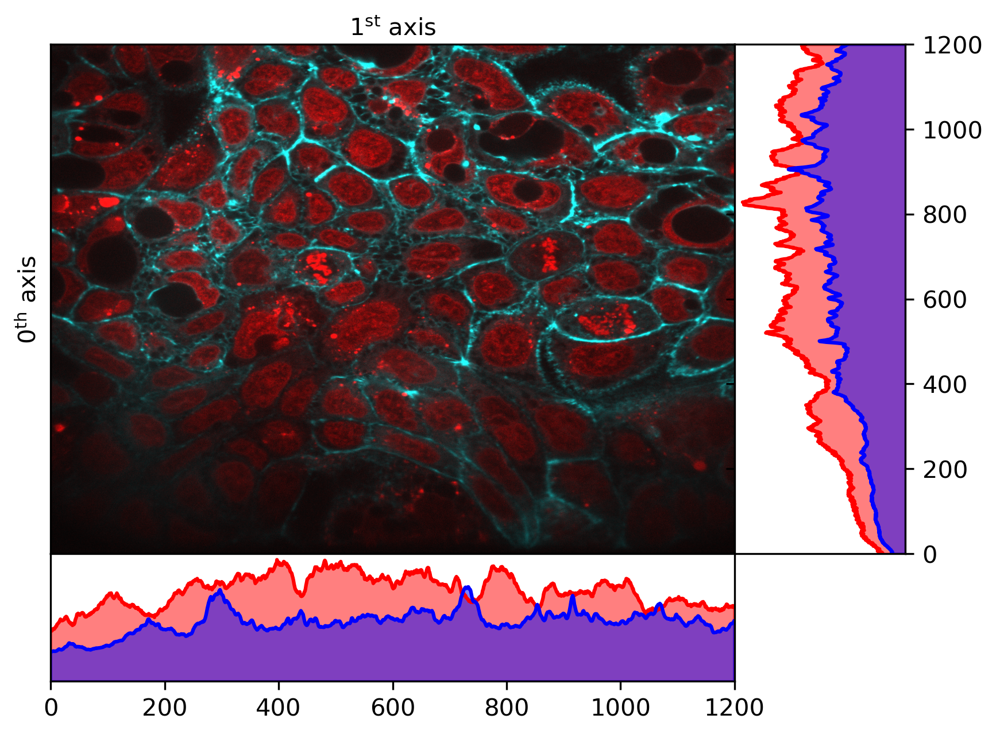

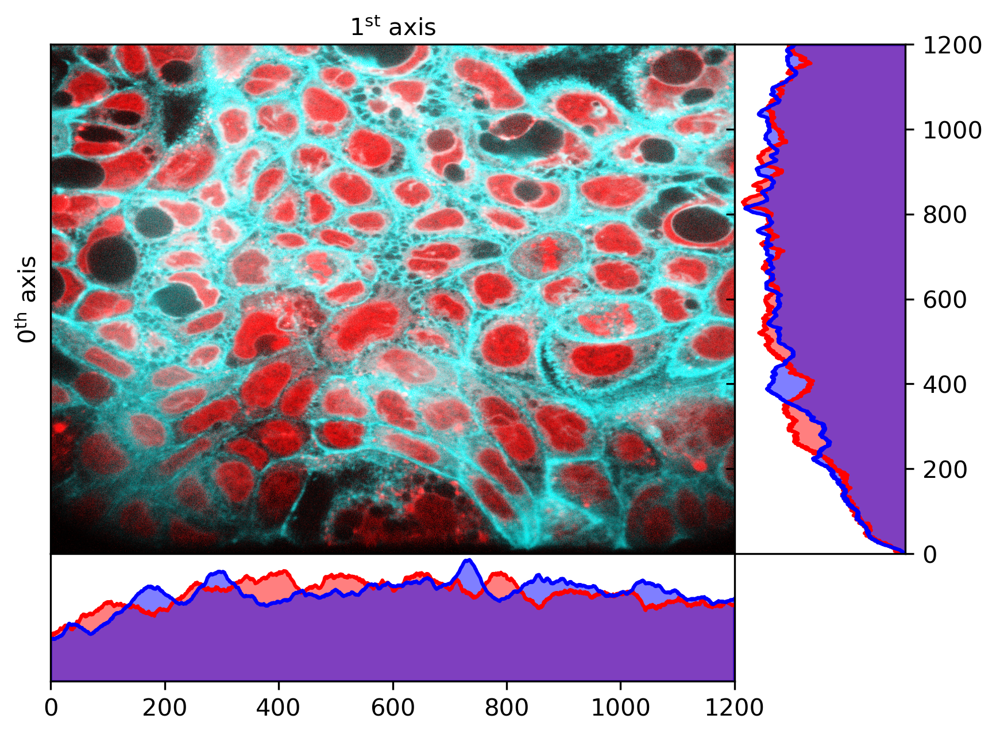

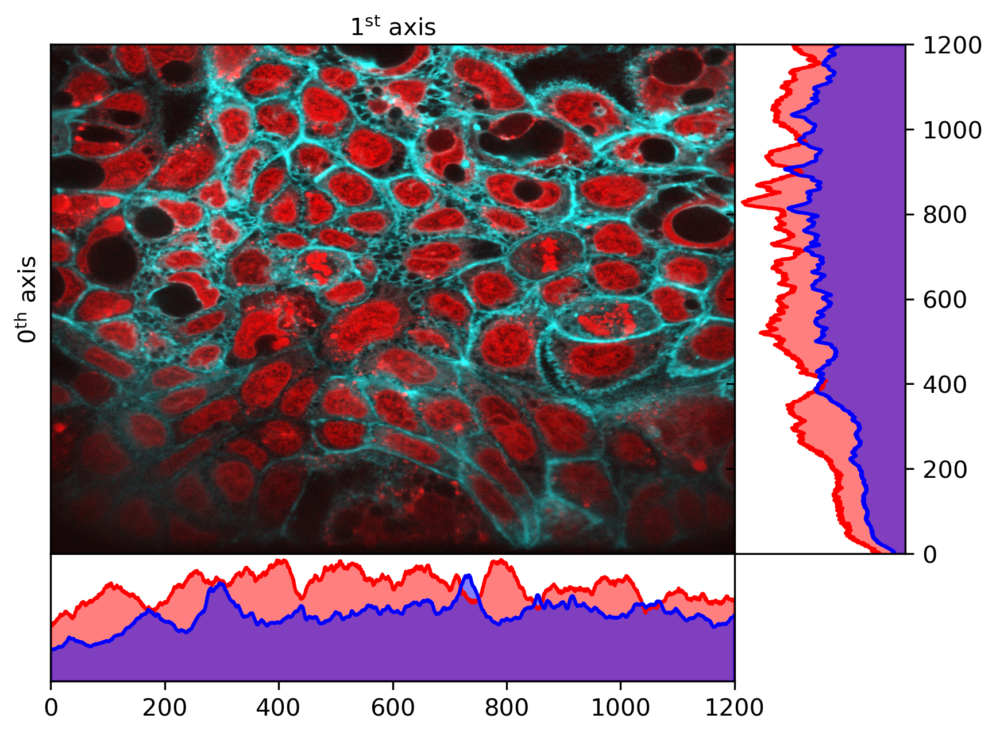

In [8]:
fname = control_fnames[0].split('/')[-1]

path1 = control_dir + fname
path2 = dir_hist + fname
path3 = dir_adapthist + fname

show_image(path1)
show_image(path2)
show_image(path3)

### Evaluate Optimal Diameter for Segmentation

In [180]:
def remove_borders(bool_matrix, flexibility:int=5):
    from numpy import argwhere
    args1 = argwhere(bool_matrix.sum(axis=1) != 0)
    args2 = argwhere(bool_matrix.sum(axis=0) != 0)

    x0, x1 = args1.min()-flexibility, args1.max()+1+flexibility
    y0, y1 = args2.min()-flexibility, args2.max()+1+flexibility

    return bool_matrix[x0:x1,y0:y1]

def decompose_masks(masks, reduce:bool=True, flexibility=5):
    from numpy import arange
    labels = arange(1, int(masks.max()+1), 1)

    result = []
    for label in labels:
        if reduce:
            result.append(remove_borders(masks == label, flexibility=flexibility))
        else:
            result.append(masks == label)
        
    return result

def evaluate_roundness(mask):
    from skimage.measure import perimeter
    from math import pi

    area = mask.sum()
    perim = perimeter(mask)

    return (4 * pi * area) / perim**2

def evaluate_colour(image, mask, bins=10):
    from numpy import histogram

    reds = image[:,:,0][mask] / 255
    blues = image[:,:,2][mask] / 255

    vals_red, edges = histogram(reds, range=(0,1), bins=bins, density=True)
    vals_blue, _ = histogram(blues, range=(0,1), bins=bins, density=True)

    return edges, vals_red, vals_blue

In [274]:
from cellpose import io, models

diameters = np.arange(10, 200+1, 10)
model = models.Cellpose(model_type='nuclei', gpu=True)

N_segments = []
Areas = []
for diameter in tqdm(diameters):
    n_segments = []
    areas = []
    for fname in control_fnames + penetramax_fnames:
        image = io.imread(dir_hist + fname.split('/')[-1])

        masks = model.eval(image, channels=[1,0], diameter=diameter)[0]

        n_segments.append(masks.max())
        areas.append(np.sum(masks != 0))

    N_segments.append(n_segments)
    Areas.append(areas)

N_segments = np.asarray(N_segments)
Areas = np.asarray(Areas)

100%|██████████| 20/20 [2:28:42<00:00, 446.14s/it]


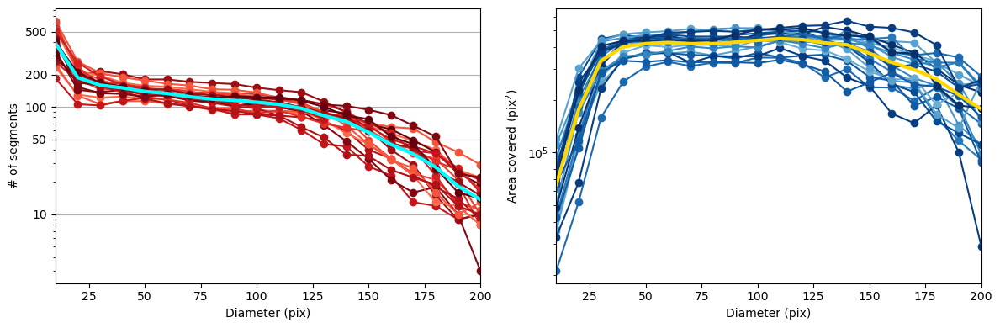

In [310]:
fig, (l, r) = plt.subplots(1, 2, figsize=(12,4))

l.set_prop_cycle(plt.cycler('color', plt.cm.Reds(np.linspace(0.5, 1, len(control_fnames)))))
r.set_prop_cycle(plt.cycler('color', plt.cm.Blues(np.linspace(0.5, 1, len(control_fnames)))))


l.plot(diameters, N_segments, '-o')
l.plot(diameters, N_segments.mean(axis=1), c='aqua', linewidth=3)
l.set_yscale('log'); l.grid(axis='y')
l.set_xlim(diameters[0], diameters[-1])#; l.set_ylim(0)
l.set_yticks([10, 50, 100, 200, 500], [10, 50, 100, 200, 500])
l.set_xlabel('Diameter (pix)'); l.set_ylabel('# of segments')

r.plot(diameters, Areas, '-o')
r.plot(diameters, Areas.mean(axis=1), c='gold', linewidth=3)
r.set_yscale('log')
r.set_xlim(diameters[0], diameters[-1])#; r.set_ylim(0)
r.set_xlabel('Diameter (pix)'); r.set_ylabel(r'Area covered (pix$^2$)')

fig.tight_layout()
fig.savefig('diameter_analysis.png', bbox_inches='tight', dpi=300)
plt.show()